# pyCisTopic scATAC processing

this code follows standard pycistopic tutorial with some slight adaptations: https://pycistopic.readthedocs.io/en/latest/notebooks/human_cerebellum.html

In [1]:
import pycisTopic
import pandas as pd
import os
pycisTopic.__version__

'2.0a0'

In [ ]:
!ls /atac/revision/COLO/outs

In [4]:
os.chdir(os.getcwd())

# Once the cistopic modeling is finished

In [ ]:
! cat logs/R-cistopic_modelling.66647953.out

In [ ]:
import pickle
file_path = "/atac/COLO/outs/cistopic_obj.pkl"
with open(file_path, 'rb') as file:
    cistopic_obj = pickle.load(file)

print(cistopic_obj)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 6273 × 365588


In [7]:
cistopic_obj.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,pct_counts_ribo,pct_counts_hb,outlier,mt_outlier,ribo_outlier,phase,S_score,G2M_score,base_index,atac_CB
CGACCTTAGCCAAACG-COLO829BL___COLO829BL,39400,4.595496,29415,4.468569,COLO829BL,227,65438,4.815837,65438,4.815837,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GTAACCACAATTACCC-COLO829BL___COLO829BL,27708,4.442605,22003,4.342482,COLO829BL,370,49904,4.698144,49904,4.698144,...,2.113990,0.0,False,False,False,G1,-0.276628,-0.452426,GATTGGCGTTCAAGAT,GTAACCACAATTACCC
TGACGGATCTACCTGA-COLO829BL___COLO829BL,30819,4.488819,25633,4.408799,COLO829BL,222,66081,4.820083,66081,4.820083,...,1.751306,0.0,False,False,False,G1,-0.012656,-0.188966,CGCTTCTAGTTAGTTG,TGACGGATCTACCTGA
TTTATCCGTTGTAACC-COLO829BL___COLO829BL,18798,4.274112,15386,4.187126,COLO829BL,724,30755,4.487930,30755,4.487930,...,2.085931,0.0,False,False,False,S,0.614542,0.183744,ATTTAGCCAATACTGT,TTTATCCGTTGTAACC
GTTGAGGTCAGGTTCC-COLO829BL___COLO829BL,27196,4.434505,21840,4.339253,COLO829BL,364,50141,4.700202,50141,4.700202,...,4.076973,0.0,False,False,False,G1,-0.259912,-0.379561,GAACCAAAGGATTGAG,GTTGAGGTCAGGTTCC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGTTCGCTCCGCCATG-COLO829_rep2___COLO829_rep2,1274,3.105169,1250,3.09691,COLO829_rep2,2663,2600,3.415140,2600,3.415140,...,1.311260,0.0,False,False,False,G1,-0.388261,-0.332489,GGTTACTAGCACTAGT,AGTTCGCTCCGCCATG
GTTGAATCAGGTTACA-COLO829_rep2___COLO829_rep2,4076,3.610234,3889,3.589838,COLO829_rep2,2367,9581,3.981456,9581,3.981456,...,0.873444,0.0,False,False,False,G1,-0.001481,-0.361263,CCAACCCGTTGCCTCA,GTTGAATCAGGTTACA
ATGCAATCATCCGCTA-COLO829_rep2___COLO829_rep2,1284,3.108565,1156,3.062958,COLO829_rep2,2659,2782,3.444513,2782,3.444513,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CAGTCTATCCTGAAGG-COLO829_rep2___COLO829_rep2,2036,3.308778,1987,3.298198,COLO829_rep2,2610,3764,3.575765,3764,3.575765,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
file_path = "/atac/COLO/outs/models.pkl"
with open(file_path, 'rb') as file:
    models = pickle.load(file)

print(models)

/opt/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-05-11 14:26:49,454	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


[<pycisTopic.lda_models.CistopicLDAModel object at 0x14ae76bff0d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae104461d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b424450>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b427cd0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b42f810>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b4335d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b43b610>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b4438d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b44fed0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ae0b45c650>, <pycisTopic.lda_models.CistopicLDAModel object at 0x14ade3ed1090>]


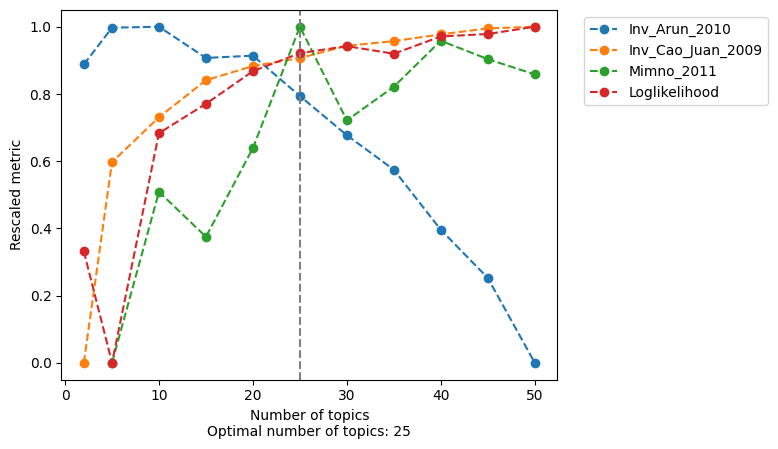

In [11]:
from pycisTopic.lda_models import evaluate_models
model = evaluate_models(
    models,
    select_model = 25,
    return_model = True
)

choosing model with 25 topics since Mimno is probably the most imporant metric

In [12]:
cistopic_obj.add_LDA_model(model)

In [13]:
out_dir = "outs"
os.makedirs(out_dir, exist_ok = True)

In [14]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "cistopic_obj.pkl"), "wb")
)

# Clustering and visualisation

In [15]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [16]:
find_clusters(
    cistopic_obj,
    target  = 'cell',
    k = 10,
    res = [0.2,0.3,0.6, 1.2, 3,6],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '-'
)

2026-05-11 14:27:27,717 cisTopic     INFO     Finding neighbours


In [17]:
# sanity check that I removed all scATAC doublets - here I did not
cistopic_obj.cell_data[(cistopic_obj.cell_data.total_fragments_count) > 60000]

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,S_score,G2M_score,base_index,atac_CB,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6
CGACCTTAGCCAAACG-COLO829BL___COLO829BL,39400,4.595496,29415,4.468569,COLO829BL,227,65438,4.815837,65438,4.815837,...,NaN,NaN,NaN,NaN,2,2,6,11,20,42
TGACGGATCTACCTGA-COLO829BL___COLO829BL,30819,4.488819,25633,4.408799,COLO829BL,222,66081,4.820083,66081,4.820083,...,-0.012656,-0.188966,CGCTTCTAGTTAGTTG,TGACGGATCTACCTGA,2,2,6,7,30,51
TGGGCGTAGTCCCGCA-COLO829BL___COLO829BL,80183,4.904082,55935,4.747684,COLO829BL,25,170811,5.232518,170811,5.232518,...,-0.243387,-0.302235,TGCTTCATCACACAGT,TGGGCGTAGTCCCGCA,2,2,6,11,20,42
ACGTTATTCTTAAGGA-COLO829BL___COLO829BL,28330,4.452247,23531,4.37164,COLO829BL,258,60074,4.778694,60074,4.778694,...,-0.261953,-0.201322,TCCTCACAGCACAGAA,ACGTTATTCTTAAGGA,2,2,6,11,20,51
GACATTAAGTCGCGAA-COLO829BL___COLO829BL,36262,4.559452,29297,4.466823,COLO829BL,161,77072,4.886902,77072,4.886902,...,NaN,NaN,NaN,NaN,2,2,6,11,20,42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCGGTAGGTAGGTTTC-COLO829_rep2___COLO829_rep2,41494,4.617985,33616,4.526546,COLO829_rep2,170,80133,4.903817,80133,4.903817,...,0.264062,0.678276,CCAGGAACAGGCATCT,GCGGTAGGTAGGTTTC,1,1,1,6,18,8
AGAGCCGGTTTGAGTC-COLO829_rep2___COLO829_rep2,40021,4.602288,32425,4.51088,COLO829_rep2,176,78821,4.896647,78821,4.896647,...,-0.179958,1.185606,GAGCCTTCAATTTGGT,AGAGCCGGTTTGAGTC,1,1,1,5,14,8
ACGTTAAAGGATAACC-COLO829_rep2___COLO829_rep2,32359,4.509995,28013,4.44736,COLO829_rep2,404,61251,4.787120,61251,4.787120,...,1.415446,-0.255097,CGAAGAATCGTTATAG,ACGTTAAAGGATAACC,0,0,0,3,31,63
CGCTAACTCACAAGCG-COLO829_rep2___COLO829_rep2,30627,4.486104,25623,4.40863,COLO829_rep2,394,61904,4.791726,61904,4.791726,...,-0.072847,0.583696,CCAGCTAAGTAACGGA,CGCTAACTCACAAGCG,1,3,4,1,4,12


In [18]:
cistopic_obj.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,S_score,G2M_score,base_index,atac_CB,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6
CGACCTTAGCCAAACG-COLO829BL___COLO829BL,39400,4.595496,29415,4.468569,COLO829BL,227,65438,4.815837,65438,4.815837,...,NaN,NaN,NaN,NaN,2,2,6,11,20,42
GTAACCACAATTACCC-COLO829BL___COLO829BL,27708,4.442605,22003,4.342482,COLO829BL,370,49904,4.698144,49904,4.698144,...,-0.276628,-0.452426,GATTGGCGTTCAAGAT,GTAACCACAATTACCC,2,2,3,7,12,40
TGACGGATCTACCTGA-COLO829BL___COLO829BL,30819,4.488819,25633,4.408799,COLO829BL,222,66081,4.820083,66081,4.820083,...,-0.012656,-0.188966,CGCTTCTAGTTAGTTG,TGACGGATCTACCTGA,2,2,6,7,30,51
TTTATCCGTTGTAACC-COLO829BL___COLO829BL,18798,4.274112,15386,4.187126,COLO829BL,724,30755,4.487930,30755,4.487930,...,0.614542,0.183744,ATTTAGCCAATACTGT,TTTATCCGTTGTAACC,2,2,6,11,22,4
GTTGAGGTCAGGTTCC-COLO829BL___COLO829BL,27196,4.434505,21840,4.339253,COLO829BL,364,50141,4.700202,50141,4.700202,...,-0.259912,-0.379561,GAACCAAAGGATTGAG,GTTGAGGTCAGGTTCC,2,2,3,7,12,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGTTCGCTCCGCCATG-COLO829_rep2___COLO829_rep2,1274,3.105169,1250,3.09691,COLO829_rep2,2663,2600,3.415140,2600,3.415140,...,-0.388261,-0.332489,GGTTACTAGCACTAGT,AGTTCGCTCCGCCATG,1,3,4,1,21,0
GTTGAATCAGGTTACA-COLO829_rep2___COLO829_rep2,4076,3.610234,3889,3.589838,COLO829_rep2,2367,9581,3.981456,9581,3.981456,...,-0.001481,-0.361263,CCAACCCGTTGCCTCA,GTTGAATCAGGTTACA,0,0,0,2,1,14
ATGCAATCATCCGCTA-COLO829_rep2___COLO829_rep2,1284,3.108565,1156,3.062958,COLO829_rep2,2659,2782,3.444513,2782,3.444513,...,NaN,NaN,NaN,NaN,0,0,0,8,24,73
CAGTCTATCCTGAAGG-COLO829_rep2___COLO829_rep2,2036,3.308778,1987,3.298198,COLO829_rep2,2610,3764,3.575765,3764,3.575765,...,NaN,NaN,NaN,NaN,1,3,4,1,4,12


In [19]:
cistopic_obj.projections["cell"] = {}

In [20]:
run_umap(
    cistopic_obj,
    target  = 'cell', scale=True)

2026-05-11 14:27:31,017 cisTopic     INFO     Running UMAP


/opt/venv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [21]:
run_tsne(
    cistopic_obj,
    target  = 'cell', scale=True)

2026-05-11 14:27:53,670 cisTopic     INFO     Running TSNE


In [22]:
cistopic_obj.projections

{'cell': {'UMAP':                                                  UMAP_1    UMAP_2
  CGACCTTAGCCAAACG-COLO829BL___COLO829BL        -6.094553  1.604651
  GTAACCACAATTACCC-COLO829BL___COLO829BL        -7.394839  3.799355
  TGACGGATCTACCTGA-COLO829BL___COLO829BL        -6.859488  2.140252
  TTTATCCGTTGTAACC-COLO829BL___COLO829BL        -5.493211  1.893106
  GTTGAGGTCAGGTTCC-COLO829BL___COLO829BL        -6.629477  3.651767
  ...                                                 ...       ...
  AGTTCGCTCCGCCATG-COLO829_rep2___COLO829_rep2   9.141800  4.851020
  GTTGAATCAGGTTACA-COLO829_rep2___COLO829_rep2  12.038441  2.422546
  ATGCAATCATCCGCTA-COLO829_rep2___COLO829_rep2  14.324500  3.366841
  CAGTCTATCCTGAAGG-COLO829_rep2___COLO829_rep2   9.520634  6.072501
  CTTTGTTGTGGCTTCA-COLO829_rep2___COLO829_rep2  10.467709  2.230094
  
  [6273 rows x 2 columns],
  'tSNE':                                                  tSNE_1     tSNE_2
  CGACCTTAGCCAAACG-COLO829BL___COLO829BL        69.403831  15

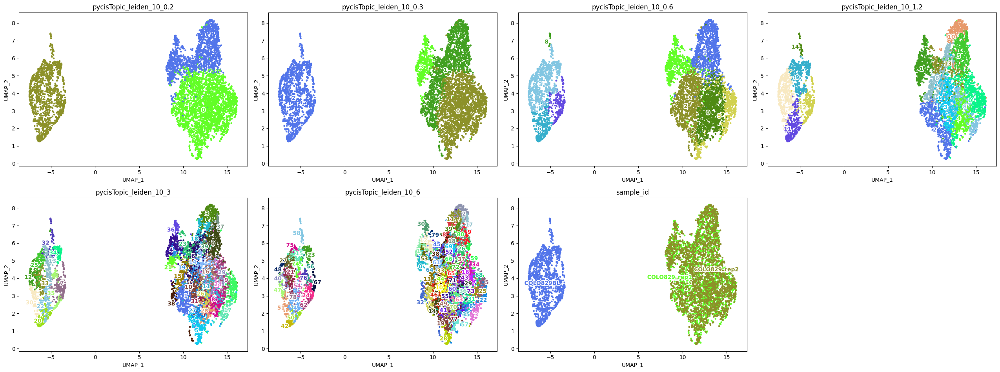

In [23]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['pycisTopic_leiden_10_0.2', 'pycisTopic_leiden_10_0.3','pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3','pycisTopic_leiden_10_6','sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

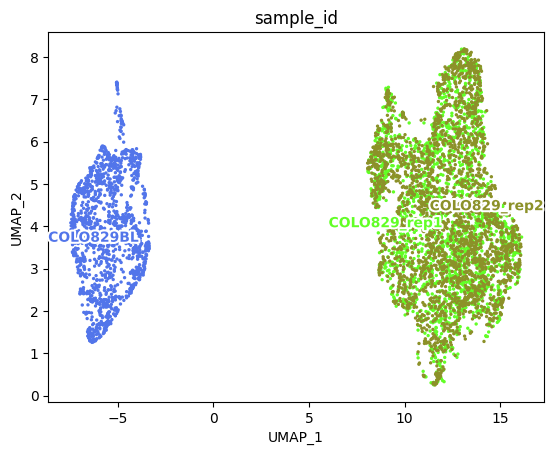

In [24]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['sample_id'],
    target='cell',
    text_size=10,
    dot_size=2)

In [25]:
cistopic_obj.cell_data.columns

Index(['cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc',
       'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank',
       'total_fragments_count', 'log10_total_fragments_count',
       'unique_fragments_count', 'log10_unique_fragments_count',
       'total_fragments_in_peaks_count',
       'log10_total_fragments_in_peaks_count',
       'unique_fragments_in_peaks_count',
       'log10_unique_fragments_in_peaks_count',
       'fraction_of_fragments_in_peaks', 'duplication_count',
       'duplication_ratio', 'nucleosome_signal', 'tss_enrichment',
       'pdf_values_for_tss_enrichment',
       'pdf_values_for_fraction_of_fragments_in_peaks',
       'pdf_values_for_duplication_ratio', 'barcode', 'sample',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt',
       'pct_counts_ribo', 'pct_counts_hb', 'outlier', 'mt_outlier',
       'ribo_outlier', 'phase', 'S_score', 'G2M_score', 'base

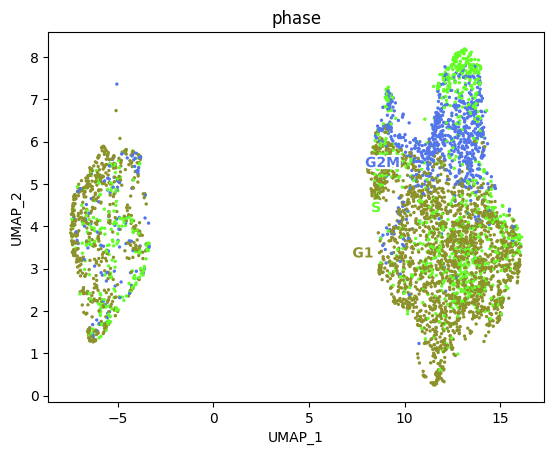

In [26]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['phase'],
    target='cell',
    text_size=10,
    dot_size=2)

In [27]:
cistopic_obj.cell_data.tss_enrichment.max()

26.815009369789443

In [28]:
cistopic_obj.cell_data.tss_enrichment.min()

7.500138325514316

In [29]:
cistopic_obj.cell_data.tss_enrichment.median()

10.493577176397633

In [30]:
cistopic_obj.cell_data.fraction_of_fragments_in_peaks.median()

0.5158982256874258

In [31]:
cistopic_obj.cell_data.log10_unique_fragments_count.median()

4.537025310604068

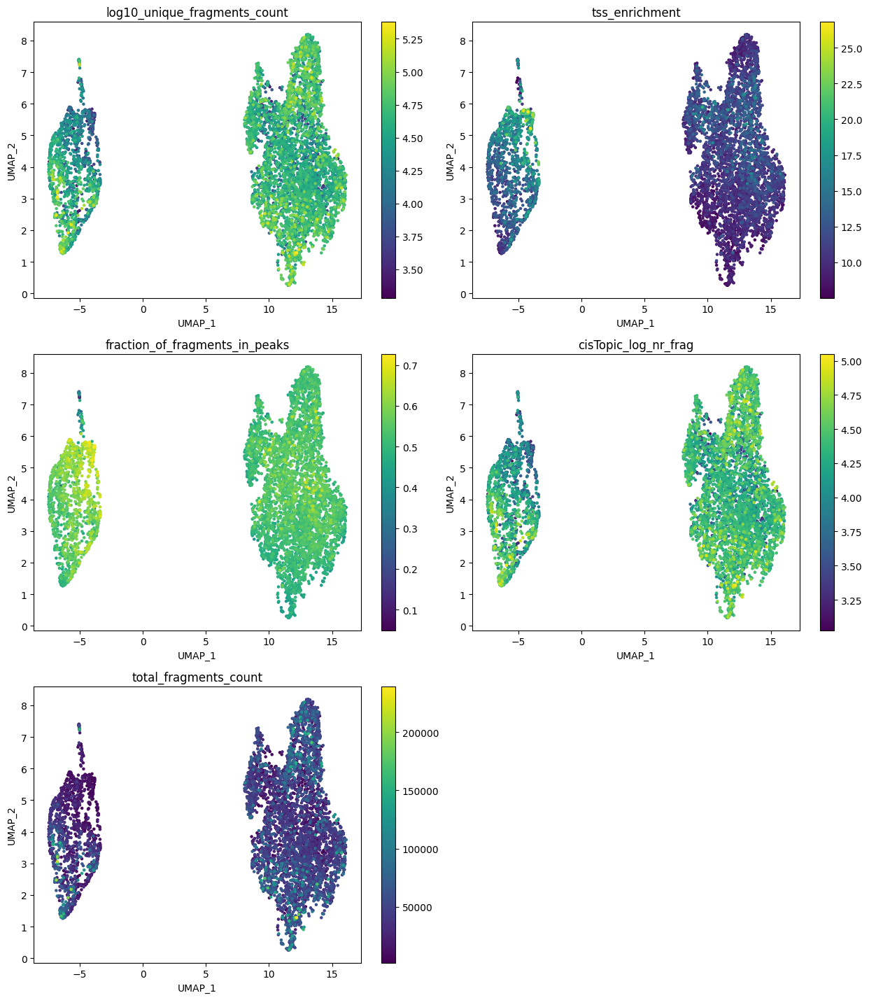

In [32]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'fraction_of_fragments_in_peaks', 'cisTopic_log_nr_frag', 'total_fragments_count'],
    target='cell', num_columns=2,
    text_size=10,
    dot_size=5)

In [33]:
tss_median = (
    cistopic_obj.cell_data
    .groupby("sample_id")["tss_enrichment"]
    .median()
    .reset_index()
    .rename(columns={"tss_enrichment": "median_tss_enrichment"})
)
tss_median

,sample_id,median_tss_enrichment
0,COLO829BL,13.476256
1,COLO829_rep1,9.895956
2,COLO829_rep2,10.214043


In [34]:
frip_median = (
    cistopic_obj.cell_data
    .groupby("sample_id")["fraction_of_fragments_in_peaks"]
    .median()
    .reset_index()
    .rename(columns={"fraction_of_fragments_in_peaks": "fraction_of_fragments_in_peaks_enrichment"})
)
frip_median

,sample_id,fraction_of_fragments_in_peaks_enrichment
0,COLO829BL,0.556951
1,COLO829_rep1,0.502993
2,COLO829_rep2,0.515681


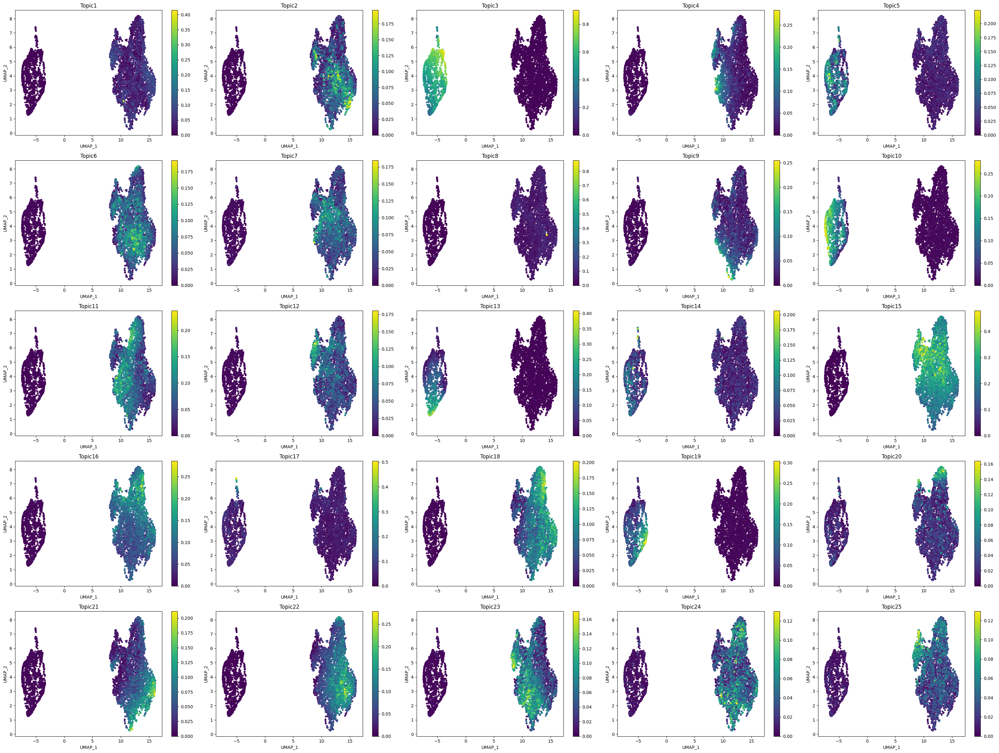

In [35]:
# cell topic contributions- 
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP',
    target = 'cell',
    num_columns=5
)

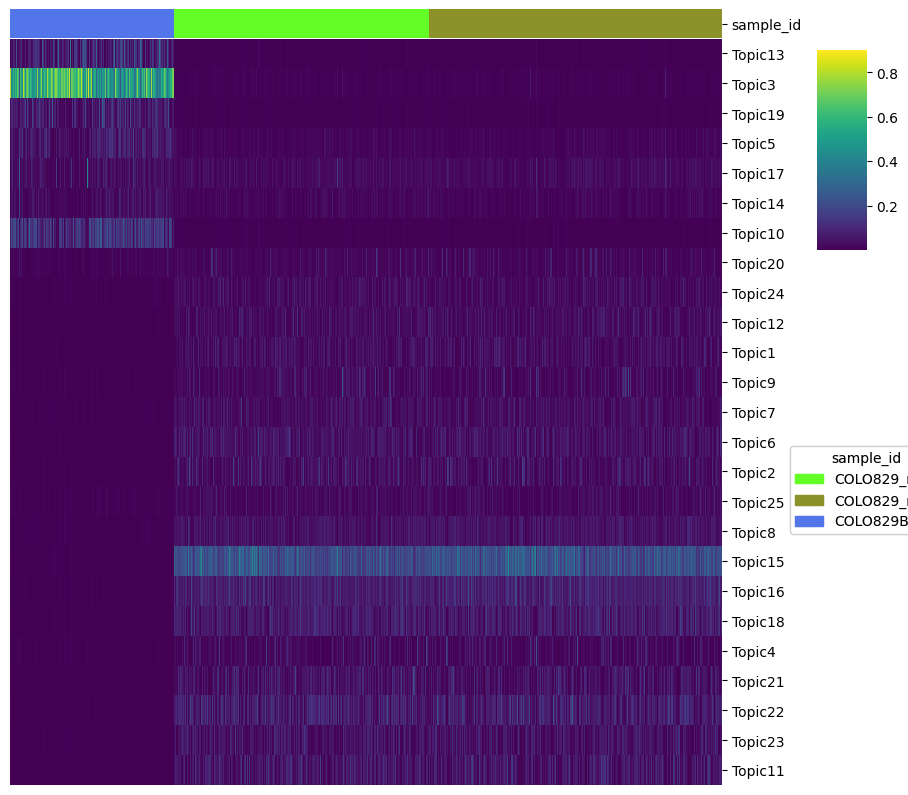

In [36]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['sample_id'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (10, 10)
)

# Topic binarization

In [37]:
from pycisTopic.topic_binarization import binarize_topics

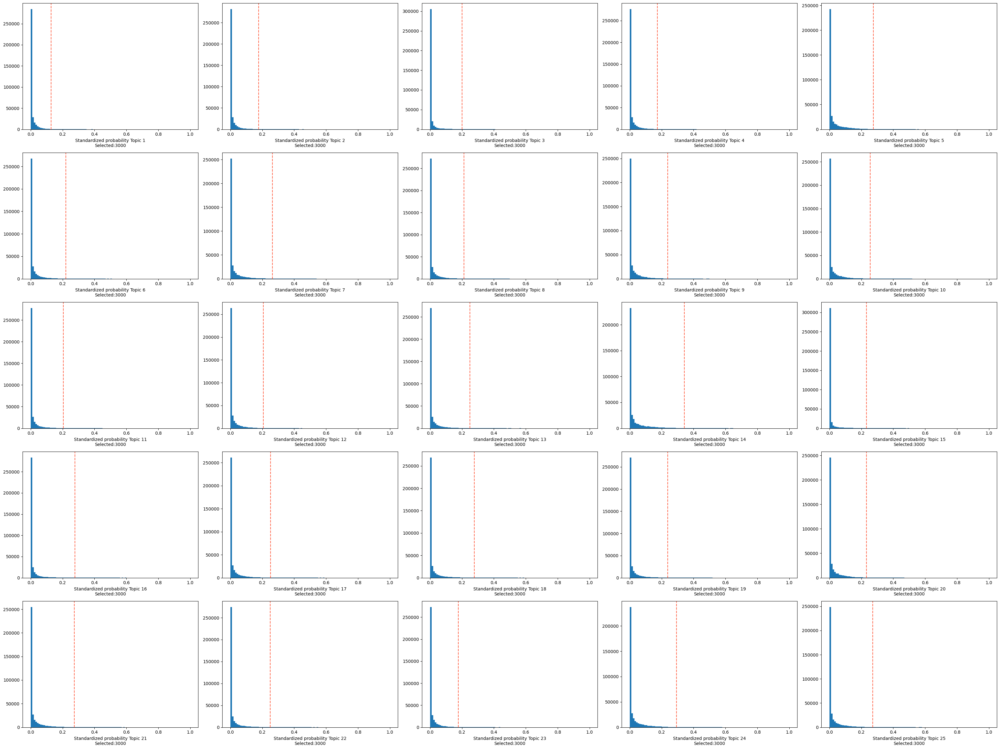

In [38]:
region_bin_topics_top_3k = binarize_topics(
    cistopic_obj, method='ntop', ntop = 3_000,
    plot=True, num_columns=5
)

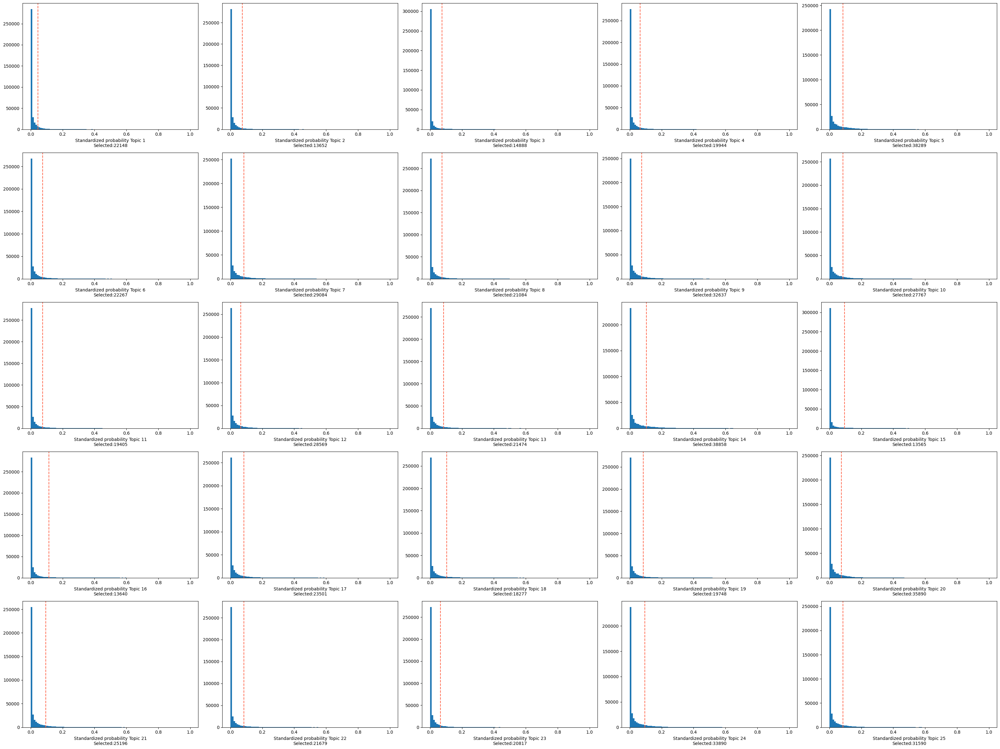

In [39]:
region_bin_topics_otsu = binarize_topics(
    cistopic_obj, method='otsu',
    plot=True, num_columns=5
)

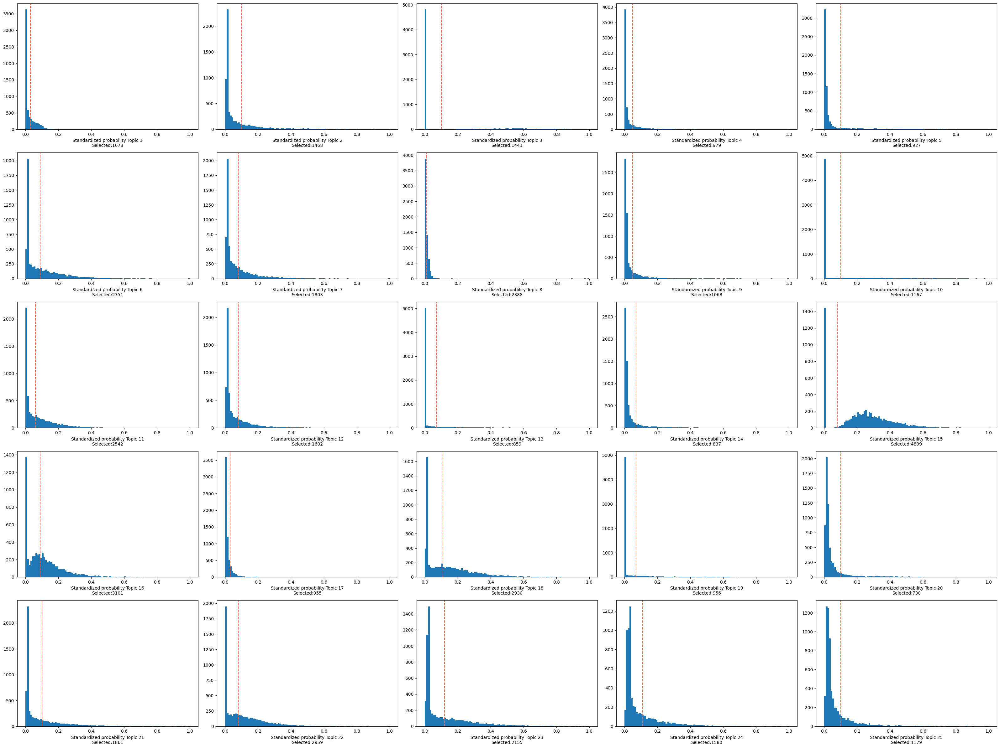

In [40]:
binarized_cell_topic = binarize_topics(
    cistopic_obj,
    target='cell',
    method='li',
    plot=True,
    num_columns=5, nbins=100)

In [41]:
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc, topic_annotation
import matplotlib.pyplot as plt
from pycisTopic.utils import fig2img

In [42]:
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

In [43]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

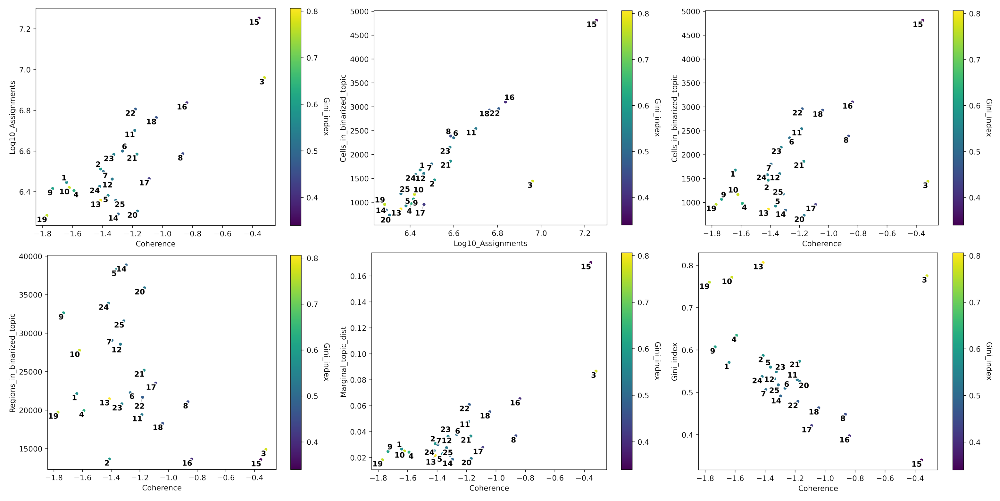

In [44]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
plt.show()

Number of assignments

Topic coherence (Mimno et al., 2011): Measures to which extent high scoring regions in the topic are actually co-accessible in the original data. If it is low it indicates that the topic is rather random. The higher, the better is a topic.

The marginal topic distribution: Indicates how much each topic contributes to the model. The higher, the better is a topic.

The gini index: Value between 0 and 1, that indicates the specificity of topics (0: General, 1:Specific)

If topics have been binarized, the number of regions/cells per topic will be added.

# Cell type - topic annotation

In [45]:
topic_annot = topic_annotation(
    cistopic_obj,
    annot_var='sample_id',
    binarized_cell_topic=binarized_cell_topic,
    general_topic_thr = 0.2
)

/opt/venv/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: divide by zero encountered in scalar divide
  zstat = value / std


In [46]:
topic_annot

,sample_id,Ratio_cells_in_topic,Ratio_group_in_population,is_general
Topic1,"COLO829_rep1, COLO829_rep2",0.267496,0.770126,False
Topic2,"COLO829_rep1, COLO829_rep2",0.234019,0.770126,False
Topic3,COLO829BL,0.229715,0.229874,False
Topic4,"COLO829_rep1, COLO829_rep2",0.156066,0.770126,False
Topic5,COLO829BL,0.147776,0.229874,False
Topic6,"COLO829_rep1, COLO829_rep2",0.374781,0.770126,False
Topic7,"COLO829_rep1, COLO829_rep2",0.287422,0.770126,False
Topic8,"COLO829_rep1, COLO829_rep2",0.380679,0.770126,False
Topic9,"COLO829_rep1, COLO829_rep2",0.170253,0.770126,False
Topic10,COLO829BL,0.186035,0.229874,False


# DAR

In [47]:
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features
)
import numpy as np

In [48]:
imputed_acc_obj = impute_accessibility(
    cistopic_obj,
    selected_cells=None,
    selected_regions=None,
    scale_factor=10**6
)

2026-05-11 14:32:32,069 cisTopic     INFO     Imputing region accessibility
2026-05-11 14:32:32,069 cisTopic     INFO     Impute region accessibility for regions 0-20000
2026-05-11 14:32:32,630 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2026-05-11 14:32:33,172 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2026-05-11 14:32:33,712 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2026-05-11 14:32:34,251 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2026-05-11 14:32:34,791 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2026-05-11 14:32:35,331 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2026-05-11 14:32:35,871 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2026-05-11 14:32:36,412 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2026-05-11 14:32:36,951 cisTopic     

In [49]:
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)

2026-05-11 14:32:41,948 cisTopic     INFO     Normalizing imputed data
2026-05-11 14:32:51,844 cisTopic     INFO     Done!


2026-05-11 14:32:51,847 cisTopic     INFO     Calculating mean
2026-05-11 14:32:53,788 cisTopic     INFO     Calculating variance


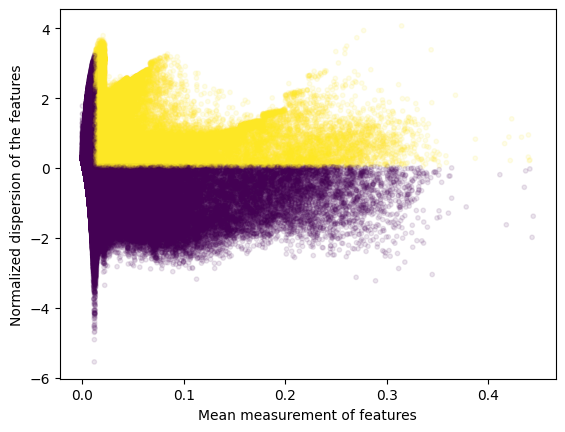

2026-05-11 14:33:12,950 cisTopic     INFO     Done!


In [50]:
variable_regions = find_highly_variable_features(
    normalized_imputed_acc_obj,
    min_disp = 0.05,
    min_mean = 0.0125,
    max_mean = 3,
    max_disp = np.inf,
    n_bins=20,
    n_top_features=None,
    plot=True
)

In [51]:
len(variable_regions)

74105

In [ ]:
markers_dict= find_diff_features(
    cistopic_obj,
    imputed_acc_obj,
    variable='sample_id',
    var_features=variable_regions,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    _temp_dir='/tmp/ray_spill',
    split_pattern = '-'
)

2026-05-11 14:33:18,280	INFO worker.py:1724 -- Started a local Ray instance.


2026-05-11 14:33:19,112 cisTopic     INFO     Subsetting data for COLO829BL (1442 of 6273)
2026-05-11 14:33:22,555 cisTopic     INFO     Computing p-value for COLO829BL
2026-05-11 14:33:31,016 cisTopic     INFO     Computing log2FC for COLO829BL
2026-05-11 14:33:32,528 cisTopic     INFO     COLO829BL done!
2026-05-11 14:33:32,534 cisTopic     INFO     Subsetting data for COLO829_rep1 (2253 of 6273)
2026-05-11 14:33:32,598 cisTopic     INFO     Computing p-value for COLO829_rep1
2026-05-11 14:33:40,106 cisTopic     INFO     Computing log2FC for COLO829_rep1
2026-05-11 14:33:40,174 cisTopic     INFO     COLO829_rep1 done!
2026-05-11 14:33:40,181 cisTopic     INFO     Subsetting data for COLO829_rep2 (2578 of 6273)
2026-05-11 14:33:40,245 cisTopic     INFO     Computing p-value for COLO829_rep2
2026-05-11 14:33:47,946 cisTopic     INFO     Computing log2FC for COLO829_rep2
2026-05-11 14:33:48,009 cisTopic     INFO     COLO829_rep2 done!


In [53]:
from pycisTopic.clust_vis import plot_imputed_features

In [54]:
cistopic_obj.cell_data.sample_id.value_counts()

COLO829_rep2    2578
COLO829_rep1    2253
COLO829BL       1442
Name: sample_id, dtype: int64

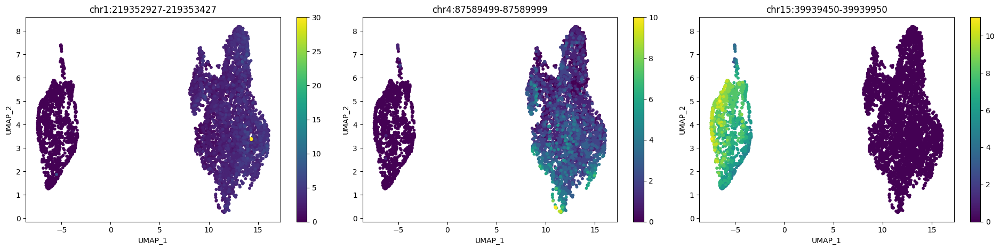

In [55]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=imputed_acc_obj,
    features=[markers_dict[x].index.tolist()[0] for x in ['COLO829_rep2','COLO829_rep1','COLO829BL']],
    scale=False,
    num_columns=4
)

In [56]:
print("Number of DARs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(markers_dict[x])}")

Number of DARs found:
---------------------
  COLO829BL: 29640
  COLO829_rep1: 37987
  COLO829_rep2: 42074


In [57]:
# save region sets
os.makedirs(os.path.join(out_dir, "region_sets"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_otsu"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_top_3k"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "DARs_cell_type"), exist_ok = True)

In [58]:
from pycisTopic.utils import region_names_to_coordinates

In [59]:
for topic in region_bin_topics_otsu:
    region_names_to_coordinates(
        region_bin_topics_otsu[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_otsu", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [60]:
for topic in region_bin_topics_top_3k:
    region_names_to_coordinates(
        region_bin_topics_top_3k[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_top_3k", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [61]:
for cell_type in markers_dict:
    region_names_to_coordinates(
        markers_dict[cell_type].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "DARs_cell_type", f"{cell_type}.bed"),
        sep = "\t",
        header = False, index = False
    )

# Gene activity

In [62]:
import pyranges as pr
from pycisTopic.gene_activity import get_gene_activity

In [63]:
chromsizes = pd.read_table(os.path.join(out_dir, "qc", "hg38.chrom_sizes_and_alias.tsv"))
chromsizes

,# ucsc,length,ensembl,refseq_id,genbank_id
0,chr1,248956422,1,NC_000001.11,CM000663.2
1,chr2,242193529,2,NC_000002.12,CM000664.2
2,chr3,198295559,3,NC_000003.12,CM000665.2
3,chr4,190214555,4,NC_000004.12,CM000666.2
4,chr5,181538259,5,NC_000005.10,CM000667.2
...,...,...,...,...,...
449,chrUn_KI270539v1,993,HSCHRUN_RANDOM_146,NT_187442.1,KI270539.1
450,chrUn_KI270385v1,990,HSCHRUN_RANDOM_195,NT_187487.1,KI270385.1
451,chrUn_KI270423v1,981,HSCHRUN_RANDOM_121,NT_187417.1,KI270423.1
452,chrUn_KI270392v1,971,HSCHRUN_RANDOM_193,NT_187485.1,KI270392.1


In [64]:
chromsizes.rename({"# ucsc": "Chromosome", "length": "End"}, axis = 1, inplace = True)
chromsizes["Start"] = 0
chromsizes = pr.PyRanges(chromsizes[["Chromosome", "Start", "End"]])

In [65]:
pr_annotation = pd.read_table(
        os.path.join(out_dir, "qc", "tss.bed")
    ).rename(
        {"Name": "Gene", "# Chromosome": "Chromosome"}, axis = 1)
pr_annotation["Transcription_Start_Site"] = pr_annotation["Start"]
pr_annotation = pr.PyRanges(pr_annotation)
pr_annotation

,Chromosome,Start,End,Gene,Score,Strand,Transcript_type,Transcription_Start_Site
0,GL000009.2,58375,58376,NaN,.,-,protein_coding,58375
1,GL000194.1,115017,115018,NaN,.,-,protein_coding,115017
2,GL000194.1,115054,115055,MAFIP,.,-,protein_coding,115054
3,GL000195.1,49163,49164,NaN,.,-,protein_coding,49163
4,GL000213.1,139654,139655,NaN,.,-,protein_coding,139654
...,...,...,...,...,...,...,...,...
87556,chrY,6911751,6911752,AMELY,.,-,protein_coding,6911751
87557,chrY,6872607,6872608,AMELY,.,-,protein_coding,6872607
87558,chrY,21918031,21918032,RBMY1E,.,-,protein_coding,21918031
87559,chrY,24047968,24047969,CDY1B,.,-,protein_coding,24047968


In [66]:
gene_act, weigths = get_gene_activity(
    imputed_acc_obj,
    pr_annotation,
    chromsizes,
    use_gene_boundaries=True, # Whether to use the whole search space or stop when encountering another gene
    upstream=[1000, 100000], # Search space upstream. The minimum means that even if there is a gene right next to it
                             # these bp will be taken (1kbp here)
    downstream=[1000,100000], # Search space downstream
    distance_weight=True, # Whether to add a distance weight (an exponential function, the weight will decrease with distance)
    decay_rate=1, # Exponent for the distance exponential funciton (the higher the faster will be the decrease)
    extend_gene_body_upstream=10000, # Number of bp upstream immune to the distance weight (their value will be maximum for
                          #this weight)
    extend_gene_body_downstream=500, # Number of bp downstream immune to the distance weight
    gene_size_weight=False, # Whether to add a weights based on the length of the gene
    gene_size_scale_factor='median', # Dividend to calculate the gene size weigth. Default is the median value of all genes
                          #in the genome
    remove_promoters=False, # Whether to remove promoters when computing gene activity scores
    average_scores=True, # Whether to divide by the total number of region assigned to a gene when calculating the gene
                          #activity score
    scale_factor=1, # Value to multiply for the final gene activity matrix
    extend_tss=[10,10], # Space to consider a promoter
    gini_weight = True, # Whether to add a gini index weigth. The more unique the region is, the higher this weight will be
    return_weights= True, # Whether to return the final weights
    project='Gene_activity') # Project name for the gene activity object

2026-05-11 14:34:25,321 cisTopic     INFO     Calculating gene boundaries
2026-05-11 14:34:38,513 cisTopic     INFO     Calculating distances


join: Strand data from other will be added as strand data to self.
If this is undesired use the flag apply_strand_suffix=False.
To turn off the warning set apply_strand_suffix to True or False.


2026-05-11 14:34:50,903 cisTopic     INFO     Calculating distance weigths
2026-05-11 14:34:51,440 cisTopic     INFO     Distance weights done
2026-05-11 14:34:51,441 cisTopic     INFO     Calculating gini weights
2026-05-11 14:35:10,143 cisTopic     INFO     Getting gene activity scores
2026-05-11 14:38:14,879 cisTopic     INFO     Creating imputed features object


In [ ]:
DAG_markers_dict= find_diff_features(
    cistopic_obj,
    gene_act,
    variable='sample_id',
    var_features=None,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    _temp_dir='/tmp/ray_spill',
    split_pattern = '-')

2026-05-11 14:38:18,578	INFO worker.py:1724 -- Started a local Ray instance.


2026-05-11 14:38:19,498 cisTopic     INFO     Subsetting data for COLO829BL (1442 of 6273)
2026-05-11 14:38:21,573 cisTopic     INFO     Computing p-value for COLO829BL
2026-05-11 14:38:25,748 cisTopic     INFO     Computing log2FC for COLO829BL
2026-05-11 14:38:27,005 cisTopic     INFO     COLO829BL done!
2026-05-11 14:38:27,010 cisTopic     INFO     Subsetting data for COLO829_rep1 (2253 of 6273)
2026-05-11 14:38:27,040 cisTopic     INFO     Computing p-value for COLO829_rep1
2026-05-11 14:38:30,441 cisTopic     INFO     Computing log2FC for COLO829_rep1
2026-05-11 14:38:30,473 cisTopic     INFO     COLO829_rep1 done!
2026-05-11 14:38:30,477 cisTopic     INFO     Subsetting data for COLO829_rep2 (2578 of 6273)
2026-05-11 14:38:30,513 cisTopic     INFO     Computing p-value for COLO829_rep2
2026-05-11 14:38:33,978 cisTopic     INFO     Computing log2FC for COLO829_rep2
2026-05-11 14:38:33,993 cisTopic     INFO     COLO829_rep2 done!


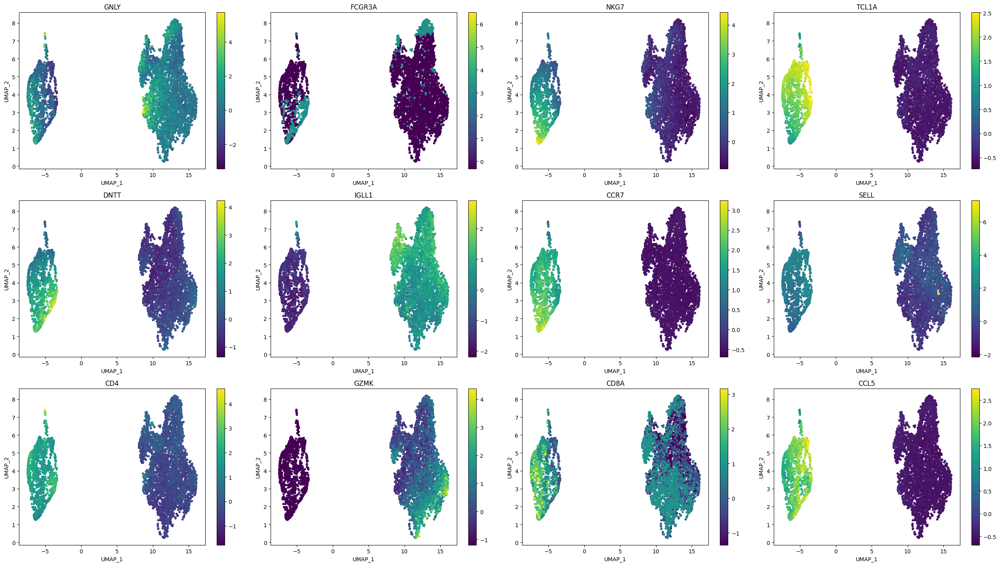

In [68]:
# cell typist
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=[
       # 'PRDX2','KCNH2','GYPA', # Mid erythroid
        'GNLY','FCGR3A','NKG7', # CD16+ NK cells
        'TCL1A', # naive B cells
        'DNTT','IGLL1', # Pro-B cells
        'CCR7','SELL','CD4', # Tcm/Naive helper T cells
        'GZMK','CD8A','CCL5'], # Tem/Trm cytotoxic T cells
    scale=True,
    num_columns=4
)


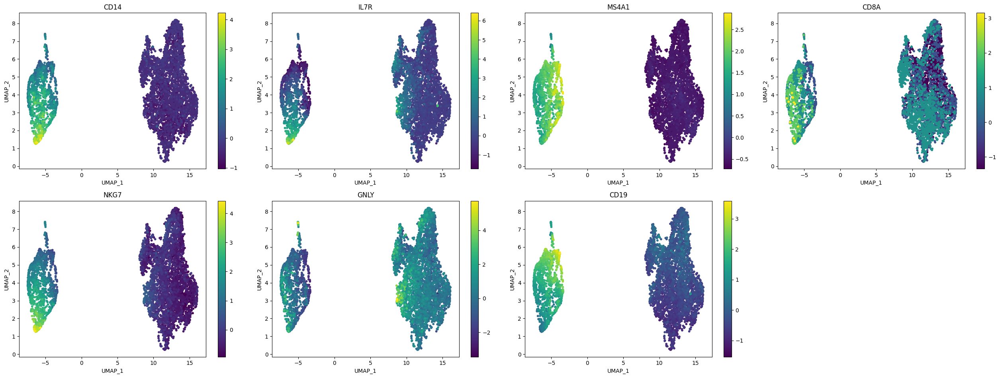

In [69]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CD14', # CD14 mono
              'IL7R', # CD4
              'MS4A1', # B
              'CD8A',  #CD8+T
              'NKG7','GNLY', #NK
              'CD19'], #CD19 B-all
    scale=True,
    num_columns=4
)

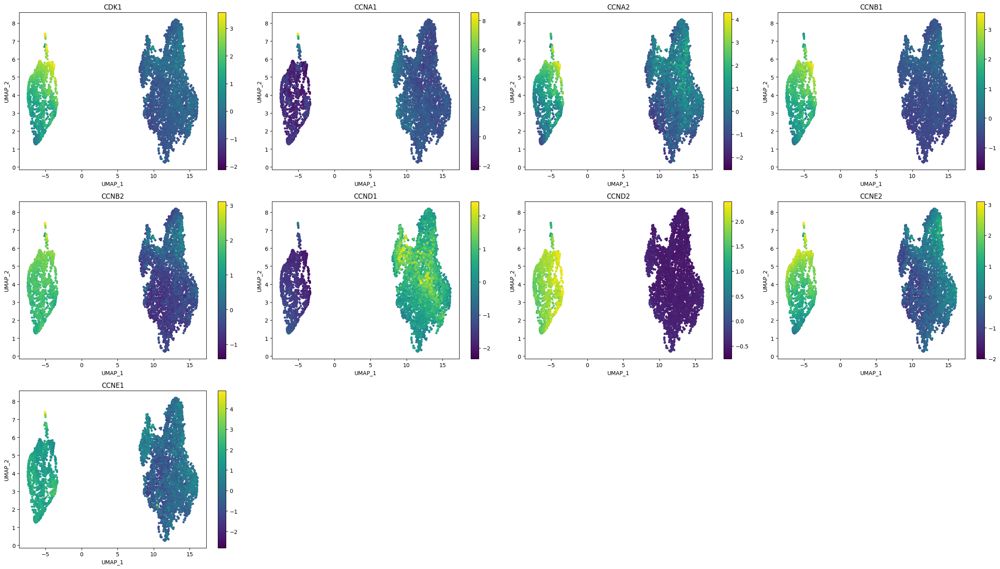

In [70]:
# cell cycle
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CDK1',
              'CCNA1','CCNA2',
              'CCNB1','CCNB2',
              'CCND1','CCND2',
              'CCNE2','CCNE1'],
    scale=True,
    num_columns=4
)

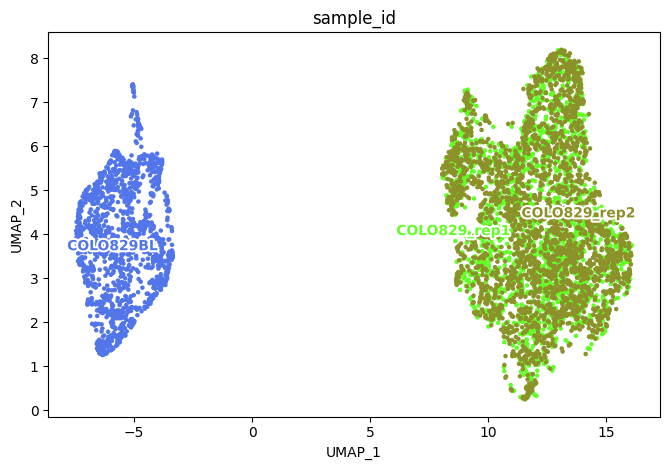

In [71]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

In [72]:
print("Number of DAGs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(DAG_markers_dict[x])}")

Number of DAGs found:
---------------------
  COLO829BL: 7783
  COLO829_rep1: 1008
  COLO829_rep2: 1384


In [84]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "cistopic_obj.pkl"), "wb")
)

## Save object to anndata 

In [ ]:
import scanpy as sc
ad = sc.AnnData(
    X = cistopic_obj.binary_matrix.T,
    obs = cistopic_obj.cell_data,
    var = cistopic_obj.region_data,
    obsm = {
	embedding: cistopic_obj.projections["cell"][embedding].values
        for embedding in cistopic_obj.projections["cell"].keys()}
)

In [74]:
ad

AnnData object with n_obs × n_vars = 6273 × 365588
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'outlier', 'mt_outlier', 'ribo_outlier', 'phase', 'S_score', 'G2M_score', 'base_index', 'atac_CB', 'pycisTopic_leiden_10_0.2', 'pycisTopic

In [75]:
ad.obsm = {key.lower(): value for key, value in ad.obsm.items()} # put obsm keys to lower to be functional in scanpy

In [76]:
ad

AnnData object with n_obs × n_vars = 6273 × 365588
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'outlier', 'mt_outlier', 'ribo_outlier', 'phase', 'S_score', 'G2M_score', 'base_index', 'atac_CB', 'pycisTopic_leiden_10_0.2', 'pycisTopic

... storing 'sample_id' as categorical
... storing 'barcode' as categorical
... storing 'base_index' as categorical
... storing 'atac_CB' as categorical
... storing 'pycisTopic_leiden_10_0.2' as categorical
... storing 'pycisTopic_leiden_10_0.3' as categorical
... storing 'pycisTopic_leiden_10_0.6' as categorical
... storing 'pycisTopic_leiden_10_1.2' as categorical
... storing 'pycisTopic_leiden_10_3' as categorical
... storing 'pycisTopic_leiden_10_6' as categorical
... storing 'Chromosome' as categorical
/opt/venv/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


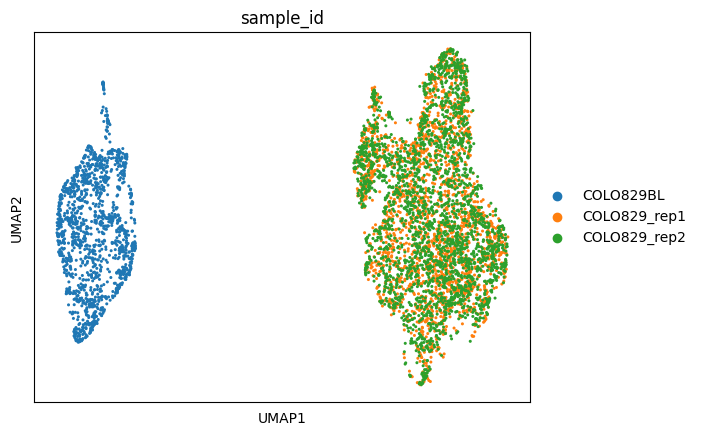

In [77]:
sc.pl.umap(ad, color ="sample_id")

In [78]:
ad.obs

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,S_score,G2M_score,base_index,atac_CB,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6
CGACCTTAGCCAAACG-COLO829BL___COLO829BL,39400,4.595496,29415,4.468569,COLO829BL,227,65438,4.815837,65438,4.815837,...,NaN,NaN,NaN,NaN,2,2,6,11,20,42
GTAACCACAATTACCC-COLO829BL___COLO829BL,27708,4.442605,22003,4.342482,COLO829BL,370,49904,4.698144,49904,4.698144,...,-0.276628,-0.452426,GATTGGCGTTCAAGAT,GTAACCACAATTACCC,2,2,3,7,12,40
TGACGGATCTACCTGA-COLO829BL___COLO829BL,30819,4.488819,25633,4.408799,COLO829BL,222,66081,4.820083,66081,4.820083,...,-0.012656,-0.188966,CGCTTCTAGTTAGTTG,TGACGGATCTACCTGA,2,2,6,7,30,51
TTTATCCGTTGTAACC-COLO829BL___COLO829BL,18798,4.274112,15386,4.187126,COLO829BL,724,30755,4.487930,30755,4.487930,...,0.614542,0.183744,ATTTAGCCAATACTGT,TTTATCCGTTGTAACC,2,2,6,11,22,4
GTTGAGGTCAGGTTCC-COLO829BL___COLO829BL,27196,4.434505,21840,4.339253,COLO829BL,364,50141,4.700202,50141,4.700202,...,-0.259912,-0.379561,GAACCAAAGGATTGAG,GTTGAGGTCAGGTTCC,2,2,3,7,12,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGTTCGCTCCGCCATG-COLO829_rep2___COLO829_rep2,1274,3.105169,1250,3.09691,COLO829_rep2,2663,2600,3.415140,2600,3.415140,...,-0.388261,-0.332489,GGTTACTAGCACTAGT,AGTTCGCTCCGCCATG,1,3,4,1,21,0
GTTGAATCAGGTTACA-COLO829_rep2___COLO829_rep2,4076,3.610234,3889,3.589838,COLO829_rep2,2367,9581,3.981456,9581,3.981456,...,-0.001481,-0.361263,CCAACCCGTTGCCTCA,GTTGAATCAGGTTACA,0,0,0,2,1,14
ATGCAATCATCCGCTA-COLO829_rep2___COLO829_rep2,1284,3.108565,1156,3.062958,COLO829_rep2,2659,2782,3.444513,2782,3.444513,...,NaN,NaN,NaN,NaN,0,0,0,8,24,73
CAGTCTATCCTGAAGG-COLO829_rep2___COLO829_rep2,2036,3.308778,1987,3.298198,COLO829_rep2,2610,3764,3.575765,3764,3.575765,...,NaN,NaN,NaN,NaN,1,3,4,1,4,12


In [79]:
ad.obs.dtypes

cisTopic_nr_frag                                   object
cisTopic_log_nr_frag                               object
cisTopic_nr_acc                                    object
cisTopic_log_nr_acc                                object
sample_id                                        category
barcode_rank                                       uint32
total_fragments_count                              uint32
log10_total_fragments_count                       float64
unique_fragments_count                             uint32
log10_unique_fragments_count                      float64
total_fragments_in_peaks_count                     uint32
log10_total_fragments_in_peaks_count              float64
unique_fragments_in_peaks_count                    uint32
log10_unique_fragments_in_peaks_count             float64
fraction_of_fragments_in_peaks                    float64
duplication_count                                  uint32
duplication_ratio                                 float64
nucleosome_sig

In [80]:
ad.obs = ad.obs.apply(lambda col: col.astype(float) if col.dtype == 'object' else col)

In [81]:
ad.obs

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,S_score,G2M_score,base_index,atac_CB,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6
CGACCTTAGCCAAACG-COLO829BL___COLO829BL,39400.0,4.595496,29415.0,4.468569,COLO829BL,227,65438,4.815837,65438,4.815837,...,NaN,NaN,NaN,NaN,2,2,6,11,20,42
GTAACCACAATTACCC-COLO829BL___COLO829BL,27708.0,4.442605,22003.0,4.342482,COLO829BL,370,49904,4.698144,49904,4.698144,...,-0.276628,-0.452426,GATTGGCGTTCAAGAT,GTAACCACAATTACCC,2,2,3,7,12,40
TGACGGATCTACCTGA-COLO829BL___COLO829BL,30819.0,4.488819,25633.0,4.408799,COLO829BL,222,66081,4.820083,66081,4.820083,...,-0.012656,-0.188966,CGCTTCTAGTTAGTTG,TGACGGATCTACCTGA,2,2,6,7,30,51
TTTATCCGTTGTAACC-COLO829BL___COLO829BL,18798.0,4.274112,15386.0,4.187126,COLO829BL,724,30755,4.487930,30755,4.487930,...,0.614542,0.183744,ATTTAGCCAATACTGT,TTTATCCGTTGTAACC,2,2,6,11,22,4
GTTGAGGTCAGGTTCC-COLO829BL___COLO829BL,27196.0,4.434505,21840.0,4.339253,COLO829BL,364,50141,4.700202,50141,4.700202,...,-0.259912,-0.379561,GAACCAAAGGATTGAG,GTTGAGGTCAGGTTCC,2,2,3,7,12,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGTTCGCTCCGCCATG-COLO829_rep2___COLO829_rep2,1274.0,3.105169,1250.0,3.096910,COLO829_rep2,2663,2600,3.415140,2600,3.415140,...,-0.388261,-0.332489,GGTTACTAGCACTAGT,AGTTCGCTCCGCCATG,1,3,4,1,21,0
GTTGAATCAGGTTACA-COLO829_rep2___COLO829_rep2,4076.0,3.610234,3889.0,3.589838,COLO829_rep2,2367,9581,3.981456,9581,3.981456,...,-0.001481,-0.361263,CCAACCCGTTGCCTCA,GTTGAATCAGGTTACA,0,0,0,2,1,14
ATGCAATCATCCGCTA-COLO829_rep2___COLO829_rep2,1284.0,3.108565,1156.0,3.062958,COLO829_rep2,2659,2782,3.444513,2782,3.444513,...,NaN,NaN,NaN,NaN,0,0,0,8,24,73
CAGTCTATCCTGAAGG-COLO829_rep2___COLO829_rep2,2036.0,3.308778,1987.0,3.298198,COLO829_rep2,2610,3764,3.575765,3764,3.575765,...,NaN,NaN,NaN,NaN,1,3,4,1,4,12


In [82]:
import datetime
date = datetime.datetime.now().strftime('%Y%m%d')
ad.write(f'./outs/{date}_atac_ball_processed.h5ad')

In [83]:
pip list

Package                              Version
------------------------------------ -----------------
adjustText                           1.0.4
aiohttp                              3.9.3
aiosignal                            1.3.1
anndata                              0.10.5.post1
annoy                                1.17.3
appdirs                              1.4.4
arboreto                             0.1.6
argparse-dataclass                   2.0.0
array_api_compat                     1.5.1
asttokens                            2.4.1
attr                                 0.3.2
attrs                                23.2.0
bbknn                                1.6.0
beautifulsoup4                       4.12.3
bidict                               0.23.1
bioservices                          1.11.2
blosc2                               2.5.1
bokeh                                3.4.0
boltons                              23.1.1
bs4                                  0.0.2
cattrs                     

In [86]:
# get umap coordinates
umap_coords = cistopic_obj.projections['cell']['UMAP']
cell_type = pd.DataFrame(cistopic_obj.cell_data[['sample_id']])
combined_df = pd.concat([umap_coords, cell_type], axis=1)
combined_df.to_csv('atac_umap_coords.csv')